In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import os as os

In [2]:
oil = pd.read_csv(r'C:\Users\sahithi aharam\Downloads\oil.csv')
holiday= pd.read_csv(r'C:\Users\sahithi aharam\Downloads\holidays_events.csv')
stores= pd.read_csv(r'C:\Users\sahithi aharam\Downloads\stores.csv')
train = pd.read_csv(r'C:\Users\sahithi aharam\Downloads\train(1).csv\train.csv')
test = pd.read_csv(r'C:\Users\sahithi aharam\Downloads\test (1).csv')
transactions = pd.read_csv(r'C:\Users\sahithi aharam\Downloads\transactions.csv\transactions.csv')

In [3]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype  
---  ------       -----  
 0   id           int64  
 1   date         object 
 2   store_nbr    int64  
 3   family       object 
 4   sales        float64
 5   onpromotion  int64  
dtypes: float64(1), int64(3), object(2)
memory usage: 137.4+ MB


In [4]:
train.onpromotion=train.onpromotion.astype('float16')

In [5]:
train['date']=pd.to_datetime(train.date)

In [6]:
train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0.0
1,1,2013-01-01,1,BABY CARE,0.0,0.0
2,2,2013-01-01,1,BEAUTY,0.0,0.0
3,3,2013-01-01,1,BEVERAGES,0.0,0.0
4,4,2013-01-01,1,BOOKS,0.0,0.0


In [7]:
train['family'].nunique() 

33

In [8]:
train['store_nbr'].nunique() 

54

In [9]:
train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0.0
1,1,2013-01-01,1,BABY CARE,0.0,0.0
2,2,2013-01-01,1,BEAUTY,0.0,0.0
3,3,2013-01-01,1,BEVERAGES,0.0,0.0
4,4,2013-01-01,1,BOOKS,0.0,0.0


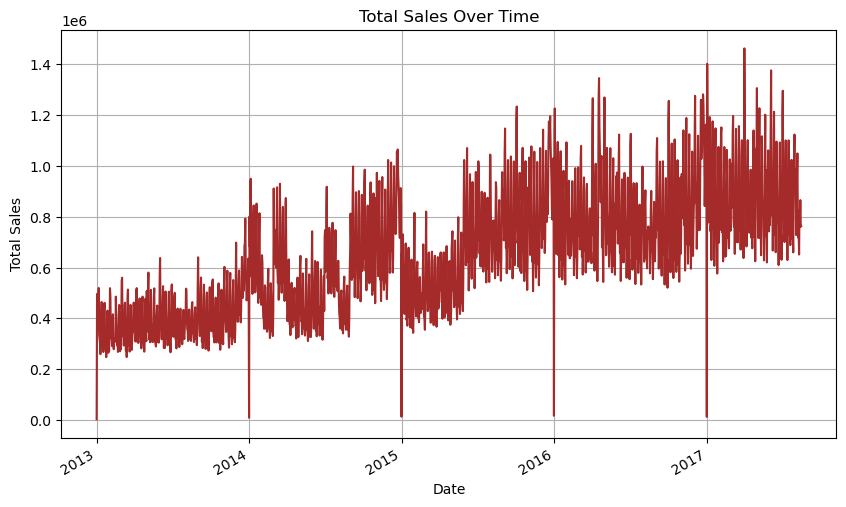

In [10]:
#plotting the total sales
plt.figure(figsize=(10, 6))
train.groupby('date')['sales'].sum().plot(color='brown')
plt.title('Total Sales Over Time')
plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.grid(True)

In [11]:
family_sales=train.groupby('family')['sales'].sum().sort_values()

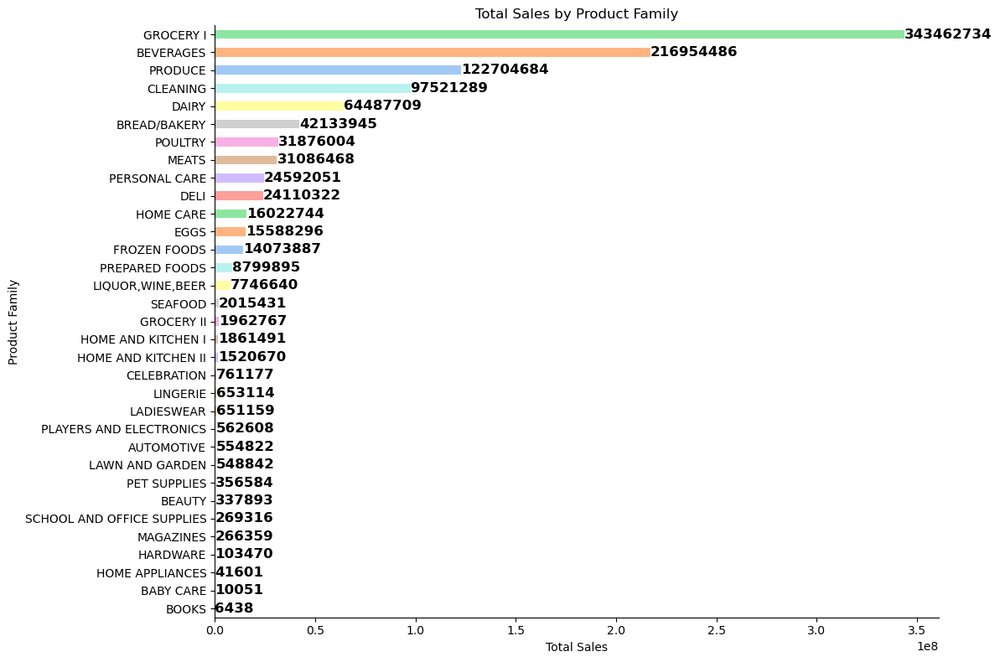

In [12]:
# Create a horizontal bar plot with improved styling
plt.figure(figsize=(12, 8))

# Use Seaborn's color palette for better color choices
colors = sns.color_palette('pastel', len(family_sales))

family_sales.plot(kind='barh', color=colors)
plt.ylabel('Product Family')
plt.xlabel('Total Sales')
plt.title('Total Sales by Product Family')

# Add data labels to the right of each bar
for i, v in enumerate(family_sales):
    plt.text(v + 10, i, str(int(v)), color='black', va='center', fontsize=12, fontweight='bold')

# Remove the top and right spines
sns.despine()

# Show the plot
plt.tight_layout()
plt.show()

In [13]:
store_sales=train.groupby('store_nbr')['sales'].sum().sort_values()

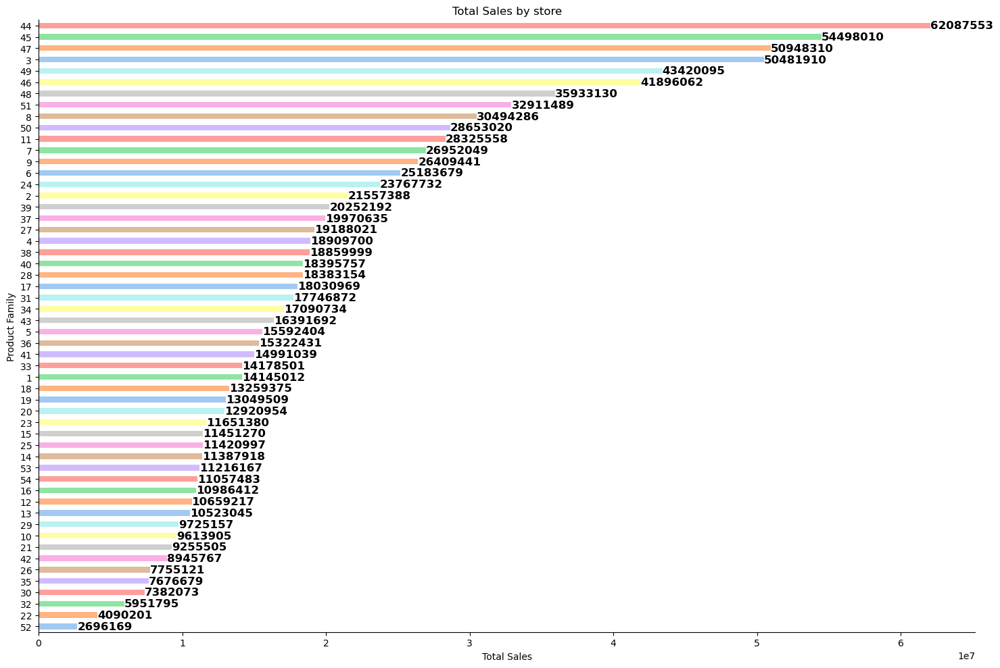

In [14]:
# Create a horizontal bar plot with improved styling
plt.figure(figsize=(15, 10))

# Use Seaborn's color palette for better color choices
colors = sns.color_palette('pastel', len(store_sales))

store_sales.plot(kind='barh', color=colors)
plt.ylabel('Product Family')
plt.xlabel('Total Sales')
plt.title('Total Sales by store')

# Add data labels to the right of each bar
for i, v in enumerate(store_sales):
    plt.text(v + 10, i, str(int(v)), color='black', va='center', fontsize=12,fontweight='bold')

# Remove the top and right spines
sns.despine()

# Show the plot
plt.tight_layout()
plt.show()

In [15]:
daily_sales=train.set_index('date').groupby('store_nbr').resample('D').sales.sum().reset_index()
px.line(daily_sales,y='sales',x='date',color='store_nbr',title='total daily sales of stores')

c:\Users\sahithi aharam\.conda\envs\tensorflow\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


In [16]:
#
print(train.shape)
train = train[~((train.store_nbr == 52) & (train.date < '2017-04-20'))]
train = train[~((train.store_nbr == 22) & (train.date < '2015-10-09'))]
train = train[~((train.store_nbr == 42) & (train.date < '2015-08-21'))]
train = train[~((train.store_nbr == 21) & (train.date < '2015-07-24'))]
train = train[~((train.store_nbr == 29) & (train.date < '2015-03-20'))]
train = train[~((train.store_nbr == 20) & (train.date < '2015-02-13'))]
train = train[~((train.store_nbr == 36) & (train.date < '2013-05-09'))]
train = train[~((train.store_nbr == 53) & (train.date < '2014-05-29'))]

print(train.shape)

(3000888, 6)
(2780316, 6)


In [17]:
transactions['date']=pd.to_datetime(transactions.date)

In [18]:
transactions.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [19]:
px.line(transactions,x='date',y='transactions',color='store_nbr',title='total transaction of store')

c:\Users\sahithi aharam\.conda\envs\tensorflow\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [20]:
total_sales=train.groupby(['date','store_nbr'])['sales'].sum().reset_index()

In [21]:
tempt=pd.merge(total_sales,transactions, how='left')

The correlation between total sales & transactions is: 0.8174644354591597


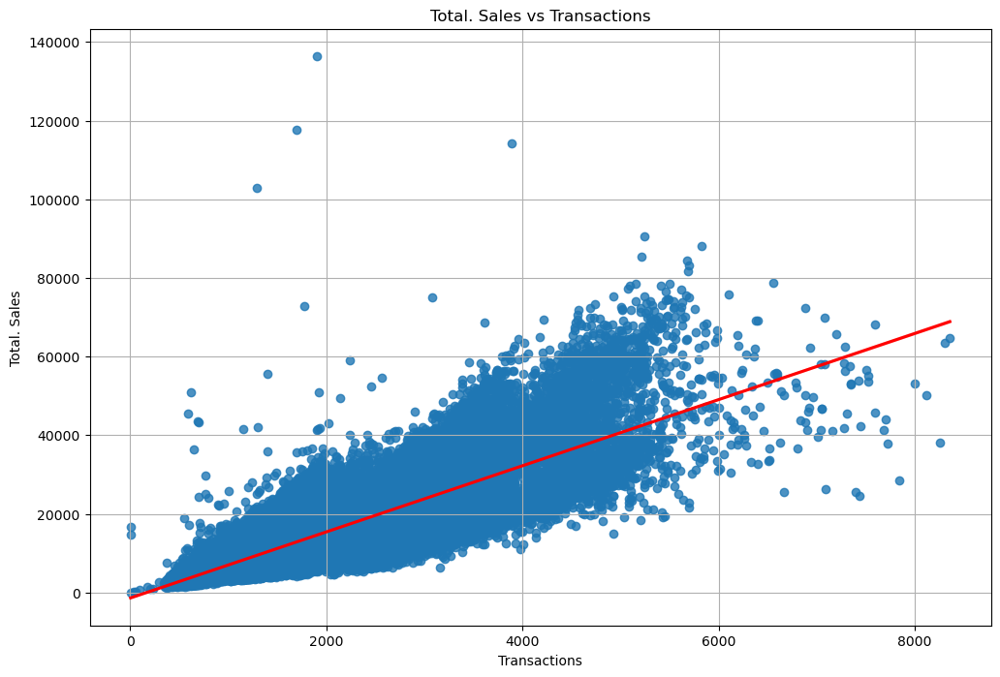

In [22]:
plt.figure(figsize=(12, 8))
sns.regplot(tempt,x='transactions',y='sales',line_kws={'color':'red',})
print('The correlation between total sales & transactions is:'
      ,tempt.corr('spearman').sales.loc['transactions'])
plt.xlabel('Transactions')
plt.ylabel('Total. Sales')
plt.title('Total. Sales vs Transactions')
plt.grid(True)
plt.show()

In [23]:
del tempt

In [24]:
transactions.set_index('date')
transactions['month']=transactions.date.dt.month
transactions['year']=transactions.date.dt.year

tempt=transactions.groupby(['month','year'])['transactions'].mean().reset_index()

In [25]:
px.line(tempt,x='month',y='transactions',color='year',title='average transactions per month',
  )

In [26]:
del tempt

In [27]:
oil

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20
...,...,...
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46
1216,2017-08-30,45.96


In [28]:
oil.isnull().sum()

date           0
dcoilwtico    43
dtype: int64

In [29]:
oil['date']=pd.to_datetime(oil['date'])

In [30]:
oil=oil.set_index('date').resample('D').sum().reset_index()

In [31]:
oil["dcoilwtico"] = np.where(oil["dcoilwtico"] == 0, np.nan, oil["dcoilwtico"])
oil["dcoilwtico_interpolated"] =oil.dcoilwtico.interpolate()
# Plot
temp = oil.melt(id_vars=['date'], var_name='Legend') 
px.line(temp.sort_values(['Legend', 'date'], ascending=[False, True]), x='date',
        y='value', color='Legend', title='Daily Oil Price',template='plotly_dark')

c:\Users\sahithi aharam\.conda\envs\tensorflow\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [32]:
del temp

In [33]:
temp = pd.merge(pd.merge(train.groupby(["date", "store_nbr"]).sales.sum().reset_index(),
               transactions, how = "left"),oil,how='left')

In [34]:
px.scatter(temp,x='dcoilwtico_interpolated',y='sales',title='Daily Oil Price & Sales')

In [35]:
px.scatter(temp,x='dcoilwtico_interpolated',y='transactions',title='Daily Oil Price & transactions')

In [36]:
stores.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [37]:
store_count=stores.groupby(['store_nbr','city','type']).nunique().reset_index()

In [38]:
px.bar(store_count,y='city',x='store_nbr',title='number of store in each city',color='type')

In [39]:
temp=pd.merge(stores,train,on='store_nbr',how='left')

In [40]:
average_sales_city=temp.groupby('city')['sales'].sum().reset_index()
average_sales_city=average_sales_city.rename(columns={'sales':'total_sales'})

In [41]:
px.pie(average_sales_city.sort_values(by='total_sales',ascending=False),
            names='city',values='total_sales',title='Total Sales by City')

In [42]:
del temp

In [43]:
holiday.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [44]:
holiday['date']=pd.to_datetime(holiday['date'])

In [45]:
temp_train=train.groupby('date')['sales'].sum()

In [46]:
temp=pd.merge(holiday,temp_train,how='left',on='date')

In [47]:
fig=px.scatter(temp,x='date',y='sales',color='type')
fig.update_layout({"title": f'total Sales on Holiday Events days',
                   "xaxis": {"title":"HOLIDAY EVENT DATE"},
                   "yaxis": {"title":"total Sales"},
                   "showlegend": True},template='plotly_dark')
fig.add_annotation(x='2014-07-05',y=850000,xref="x",yref="y",text="WORLD CUP",showarrow=True,
                   align="center",arrowhead=2,arrowsize=1,arrowwidth=1,ax=0,ay=-30,borderwidth=1,
                   borderpad=3,bgcolor="#ca8ee8",opacity=0.6  )

fig.add_annotation(x='2016-04-20',y=1350000,xref="x",yref="y",text="EARTHQUAKE",showarrow=True,
                   align="center",arrowhead=2,arrowsize=1,arrowwidth=2,arrowcolor="#636363",
                   ax=0,ay=-30,bordercolor="#c7c7c7",borderpad=4,bgcolor="#ca8ee8",opacity=0.6)
fig.show()

c:\Users\sahithi aharam\.conda\envs\tensorflow\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

